# Tabular Data EDA
Erica Landreth

10/27/2024:

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

In [2]:
data_dir = os.path.abspath(os.path.join('..', 'data'))
data = pd.read_csv(os.path.join(data_dir,'train.csv'))
data_dict = pd.read_csv(os.path.join(data_dir,'data_dictionary.csv'))


In [5]:
data_dict

,Instrument,Field,Description,Type,Values,Value Labels
0,Identifier,id,Participant's ID,str,NaN,NaN
1,Demographics,Basic_Demos-Enroll_Season,Season of enrollment,str,"Spring, Summer, Fall, Winter",NaN
2,Demographics,Basic_Demos-Age,Age of participant,float,NaN,NaN
3,Demographics,Basic_Demos-Sex,Sex of participant,categorical int,"0,1","0=Male, 1=Female"
4,Children's Global Assessment Scale,CGAS-Season,Season of participation,str,"Spring, Summer, Fall, Winter",NaN
...,...,...,...,...,...,...
76,Sleep Disturbance Scale,SDS-Season,Season of participation,str,"Spring, Summer, Fall, Winter",NaN
77,Sleep Disturbance Scale,SDS-SDS_Total_Raw,Total Raw Score,int,NaN,NaN
78,Sleep Disturbance Scale,SDS-SDS_Total_T,Total T-Score,int,NaN,NaN
79,Internet Use,PreInt_EduHx-Season,Season of participation,str,"Spring, Summer, Fall, Winter",NaN


In [3]:
data.head()

,id,Basic_Demos-Enroll_Season,Basic_Demos-Age,Basic_Demos-Sex,CGAS-Season,CGAS-CGAS_Score,Physical-Season,Physical-BMI,Physical-Height,Physical-Weight,...,PCIAT-PCIAT_18,PCIAT-PCIAT_19,PCIAT-PCIAT_20,PCIAT-PCIAT_Total,SDS-Season,SDS-SDS_Total_Raw,SDS-SDS_Total_T,PreInt_EduHx-Season,PreInt_EduHx-computerinternet_hoursday,sii
0,00008ff9,Fall,5,0,Winter,51.0,Fall,16.877316,46.0,50.8,...,4.0,2.0,4.0,55.0,NaN,NaN,NaN,Fall,3.0,2.0
1,000fd460,Summer,9,0,NaN,NaN,Fall,14.035590,48.0,46.0,...,0.0,0.0,0.0,0.0,Fall,46.0,64.0,Summer,0.0,0.0
2,00105258,Summer,10,1,Fall,71.0,Fall,16.648696,56.5,75.6,...,2.0,1.0,1.0,28.0,Fall,38.0,54.0,Summer,2.0,0.0
3,00115b9f,Winter,9,0,Fall,71.0,Summer,18.292347,56.0,81.6,...,3.0,4.0,1.0,44.0,Summer,31.0,45.0,Winter,0.0,1.0
4,0016bb22,Spring,18,1,Summer,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Data Sparsity

In [ ]:
is_missing = data.isna().to_numpy()

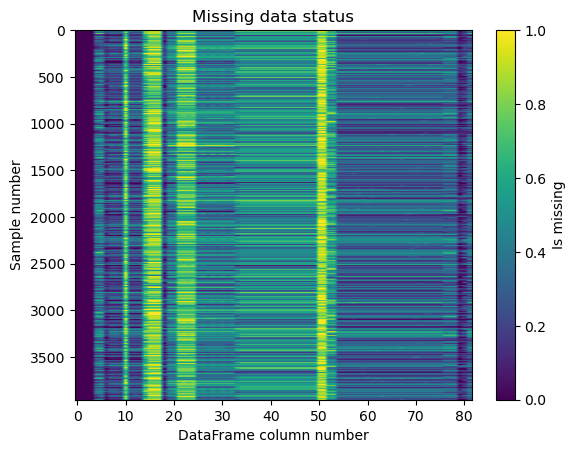

In [20]:
fig,ax = plt.subplots(1,1)
img = ax.imshow(is_missing,aspect='auto')
ax.set_xlabel('DataFrame column number')
ax.set_ylabel('Sample number')
ax.set_title('Missing data status')
cbar = plt.colorbar(img,ax=ax)
cbar.set_label('Is missing')
plt.show()

Takeaway: Lots of missing values! It also looks like there are groups of features that are missing/present. This makes sense from the data dictionary. It seems to be a compilation of many measurement methods, so each sample has the features corresponding to the measurements that were performed on that subject, and missing the others.

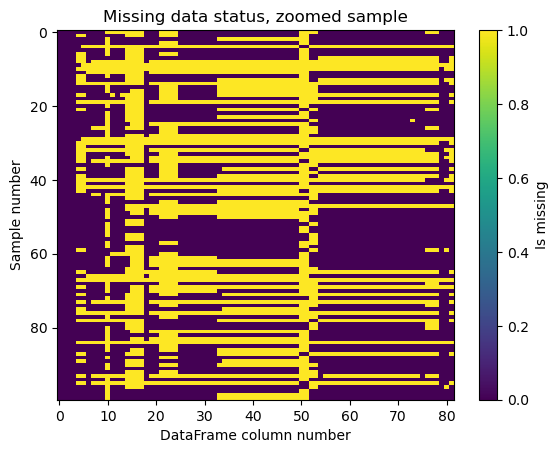

In [21]:
fig,ax = plt.subplots(1,1)
img = ax.imshow(is_missing[:100,:],aspect='auto')
ax.set_xlabel('DataFrame column number')
ax.set_ylabel('Sample number')
ax.set_title('Missing data status, zoomed sample')
cbar = plt.colorbar(img,ax=ax)
cbar.set_label('Is missing')
plt.show()

In [15]:
data.shape

(3960, 82)

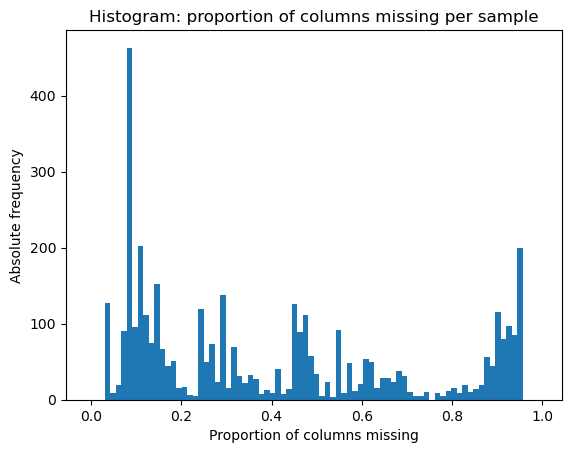

Minimum number of missing columns: 3


In [25]:
fig,ax = plt.subplots(1,1)
ax.hist(np.mean(is_missing,axis=1),bins=(np.arange(data.shape[1]+1)-0.5)/data.shape[1])
ax.set_xlabel('Proportion of columns missing')
ax.set_ylabel('Absolute frequency')
ax.set_title('Histogram: proportion of columns missing per sample')
plt.show()
print('Minimum number of missing columns:',np.min(np.sum(is_missing,axis=1)))

Takeaway: All samples are missing at least 3 columns; many are missing a vast majority of the columns.

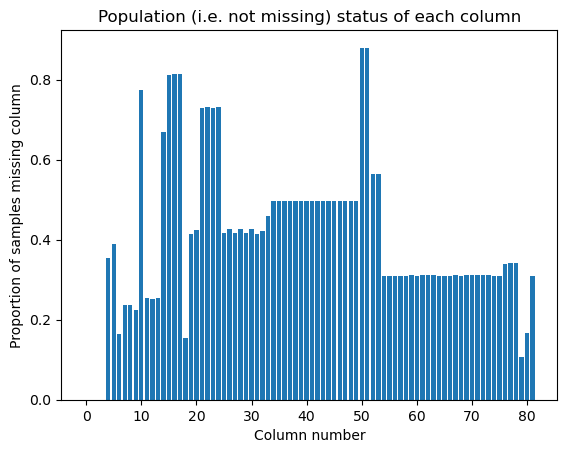

In [23]:
fig,ax = plt.subplots(1,1)
y = np.mean(is_missing,axis=0)
x = range(data.shape[1])
ax.bar(x,y)
ax.set_title('Population (i.e. not missing) status of each column')
ax.set_ylabel('Proportion of samples missing column')
ax.set_xlabel('Column number')
plt.show()

Takeaway: Some features are missing for most samples--might think about throwing these out. Many of the features are missing in at least a quarter of all samples.

#### Summary

Imputation/filtering/filling will be a huge component of preprocessing, since the data is so sparse. A few initial thoughts:
* Remove features that are missing for most samples
* Remove samples that are missing most features
* KNN approach to fill in missing feature groups? e.g. maybe children with similar "Physical Measures" will also have similar "BIA". So for samples missing BIA data, use KNN to find samples with similar Physical Measures, and use their BIA data to fill in BIA
* Whatever the approach, need to think of a reasonable way to apply it to the test data during inference

### Feature Groups

Pairplot will be overwhelming for so many features, so let's look at groups of features that come from different measurement approaches.

In [ ]:
cols = list(data.columns)
col_groups = {}

In [64]:
season_dict = {'Winter':0,'Spring':1,'Summer':2,'Fall':3}
for col in cols:
    if 'Season' in col:
        data[col] = data[col].map(season_dict)


In [65]:
# demographic features
col_groups["Basic_Demos"] = [col for col in cols if 'Basic_Demos' in col]
print("Demographics:",col_groups["Basic_Demos"])

# Children's Global Assessment Scale
col_groups["CGAS"] = [col for col in cols if 'CGAS' in col]
print("\nChildren's Global Assessment Scale:",col_groups["CGAS"])

# physical measures
col_groups["Physical"] = [col for col in cols if 'Physical' in col]
print("\nPhysical Measures:",col_groups["Physical"])

# FitnessGram vitals and treadmill
col_groups["Fitness_Endurance"] = [col for col in cols if 'Fitness_Endurance' in col]
print("\nFitnessGram Vitals and Treadmill:",col_groups["Fitness_Endurance"])

# FitnessGram Child
col_groups["FGC"] = [col for col in cols if 'FGC' in col]
print("\nFitnessGram Child:",col_groups["FGC"])

# bio-electric impedance analysis
col_groups["BIA"] = [col for col in cols if 'BIA' in col]
print("\nBio-electric Impedance Analysis:",col_groups["BIA"])

# physical activity questionnaire
col_groups["PAQ"] = [col for col in cols if 'PAQ' in col]
print("\nPhysical Activity Questionnaire:",col_groups["PAQ"])

# parent-child internet addiction test
col_groups["PCIAT"] = [col for col in cols if 'PCIAT' in col]
print("\nParent-Child Internet Addiciton Test:",col_groups["PCIAT"])

# sleep disturbance scale
col_groups["SDS"] = [col for col in cols if 'SDS' in col]
print("\nSleep Disturbance Scale:",col_groups["SDS"])

# internet use
col_groups["PreInt"] = [col for col in cols if 'PreInt' in col]
print("\nInternet Use:",col_groups["PreInt"])

Demographics: ['Basic_Demos-Enroll_Season', 'Basic_Demos-Age', 'Basic_Demos-Sex']

Children's Global Assessment Scale: ['CGAS-Season', 'CGAS-CGAS_Score']

Physical Measures: ['Physical-Season', 'Physical-BMI', 'Physical-Height', 'Physical-Weight', 'Physical-Waist_Circumference', 'Physical-Diastolic_BP', 'Physical-HeartRate', 'Physical-Systolic_BP']

FitnessGram Vitals and Treadmill: ['Fitness_Endurance-Season', 'Fitness_Endurance-Max_Stage', 'Fitness_Endurance-Time_Mins', 'Fitness_Endurance-Time_Sec']

FitnessGram Child: ['FGC-Season', 'FGC-FGC_CU', 'FGC-FGC_CU_Zone', 'FGC-FGC_GSND', 'FGC-FGC_GSND_Zone', 'FGC-FGC_GSD', 'FGC-FGC_GSD_Zone', 'FGC-FGC_PU', 'FGC-FGC_PU_Zone', 'FGC-FGC_SRL', 'FGC-FGC_SRL_Zone', 'FGC-FGC_SRR', 'FGC-FGC_SRR_Zone', 'FGC-FGC_TL', 'FGC-FGC_TL_Zone']

Bio-electric Impedance Analysis: ['BIA-Season', 'BIA-BIA_Activity_Level_num', 'BIA-BIA_BMC', 'BIA-BIA_BMI', 'BIA-BIA_BMR', 'BIA-BIA_DEE', 'BIA-BIA_ECW', 'BIA-BIA_FFM', 'BIA-BIA_FFMI', 'BIA-BIA_FMI', 'BIA-BIA_Fat', 'B

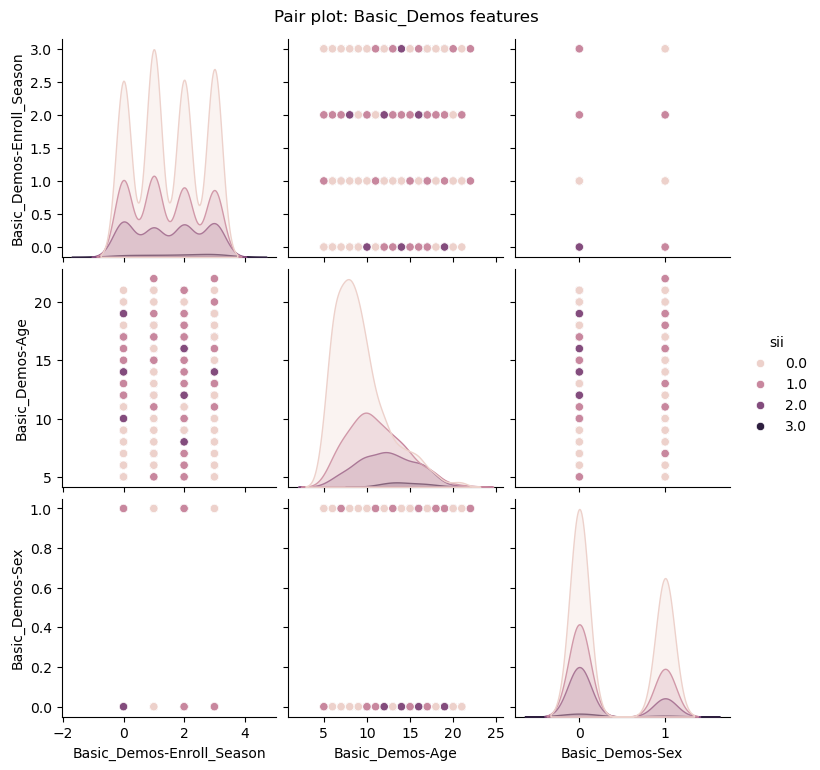

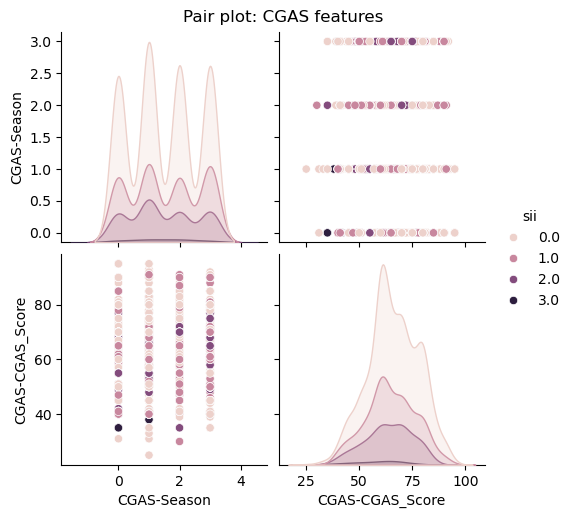

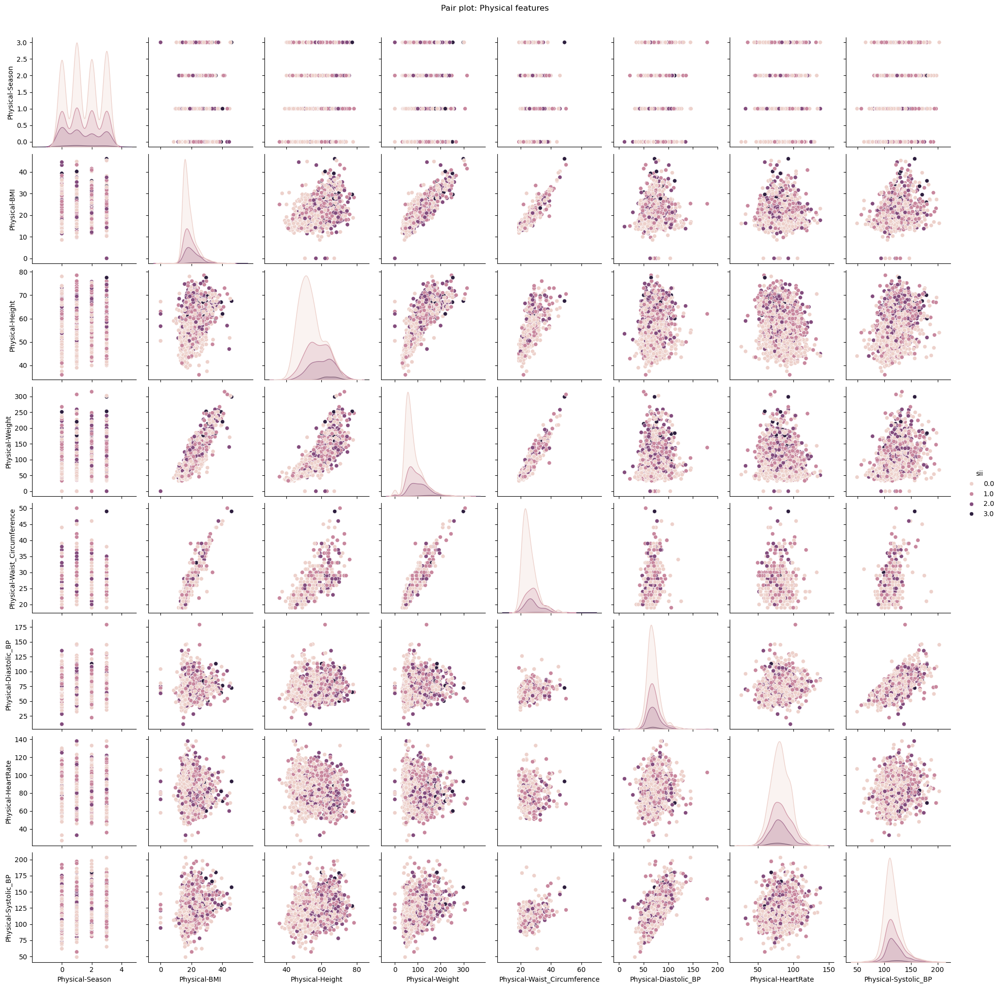

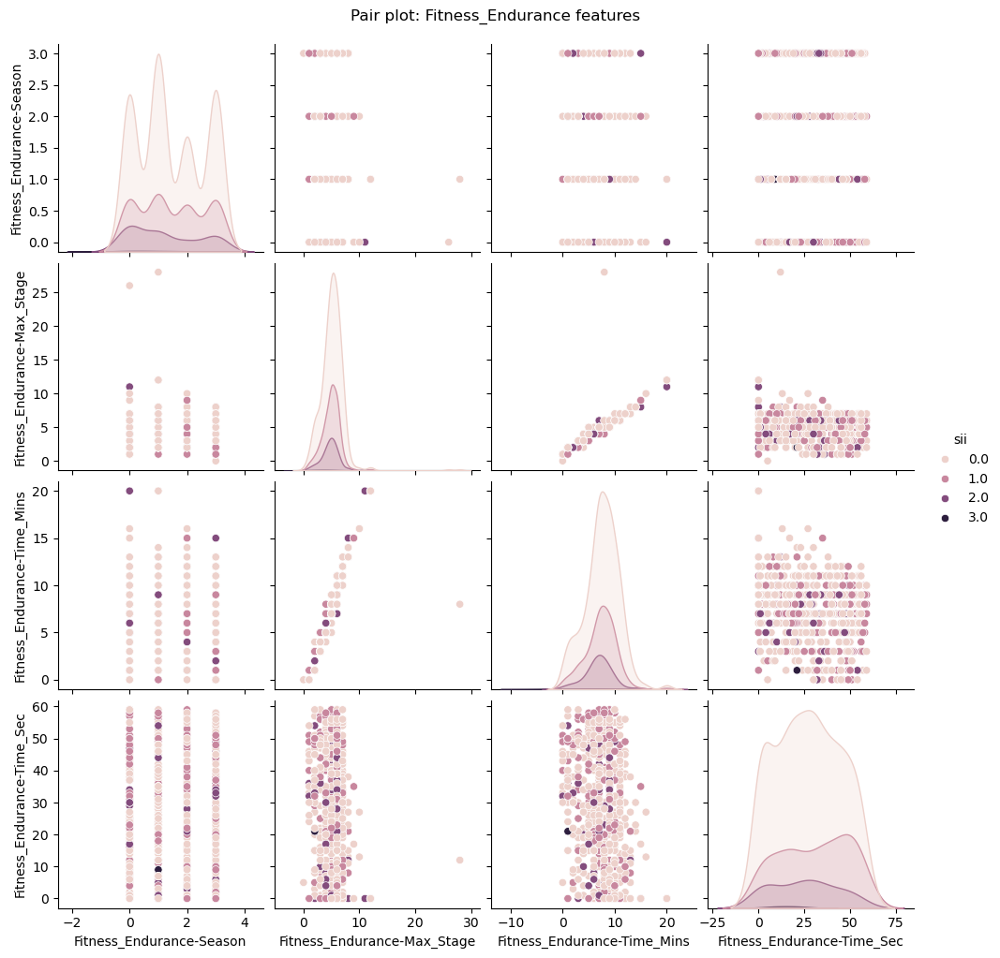

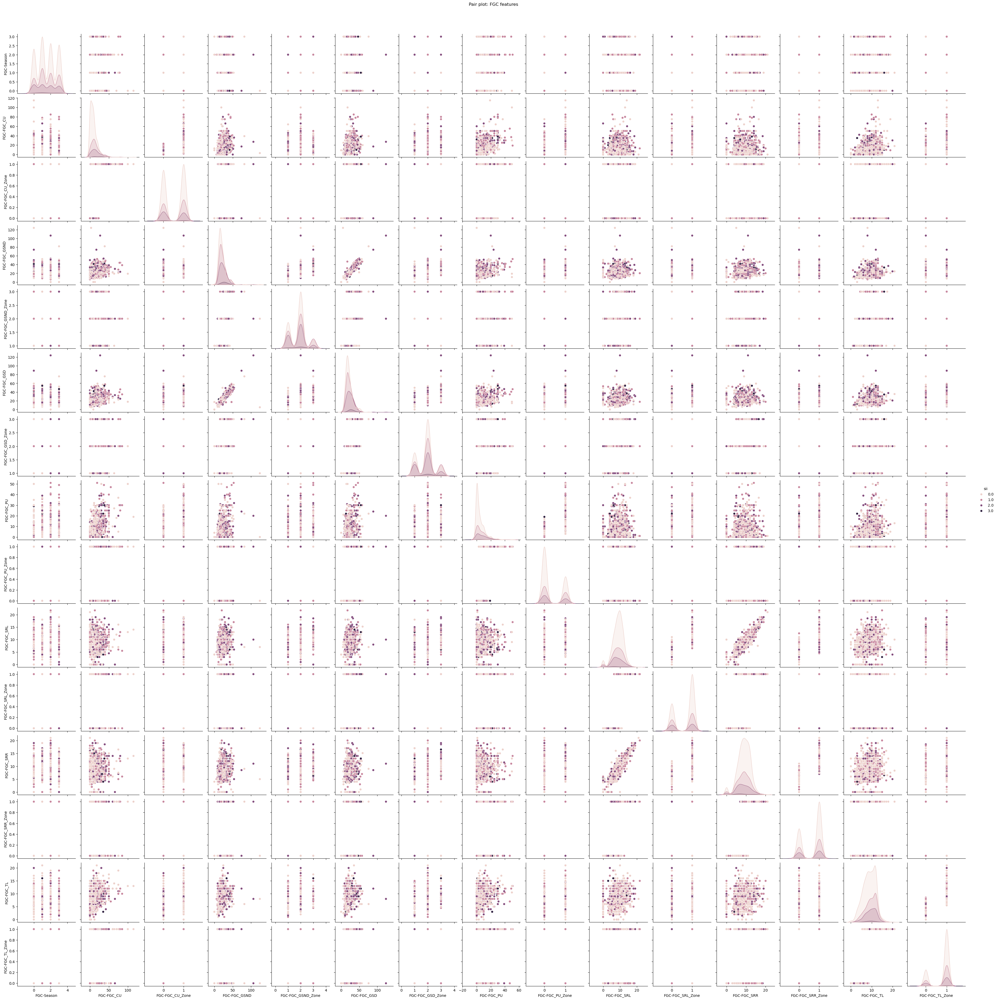

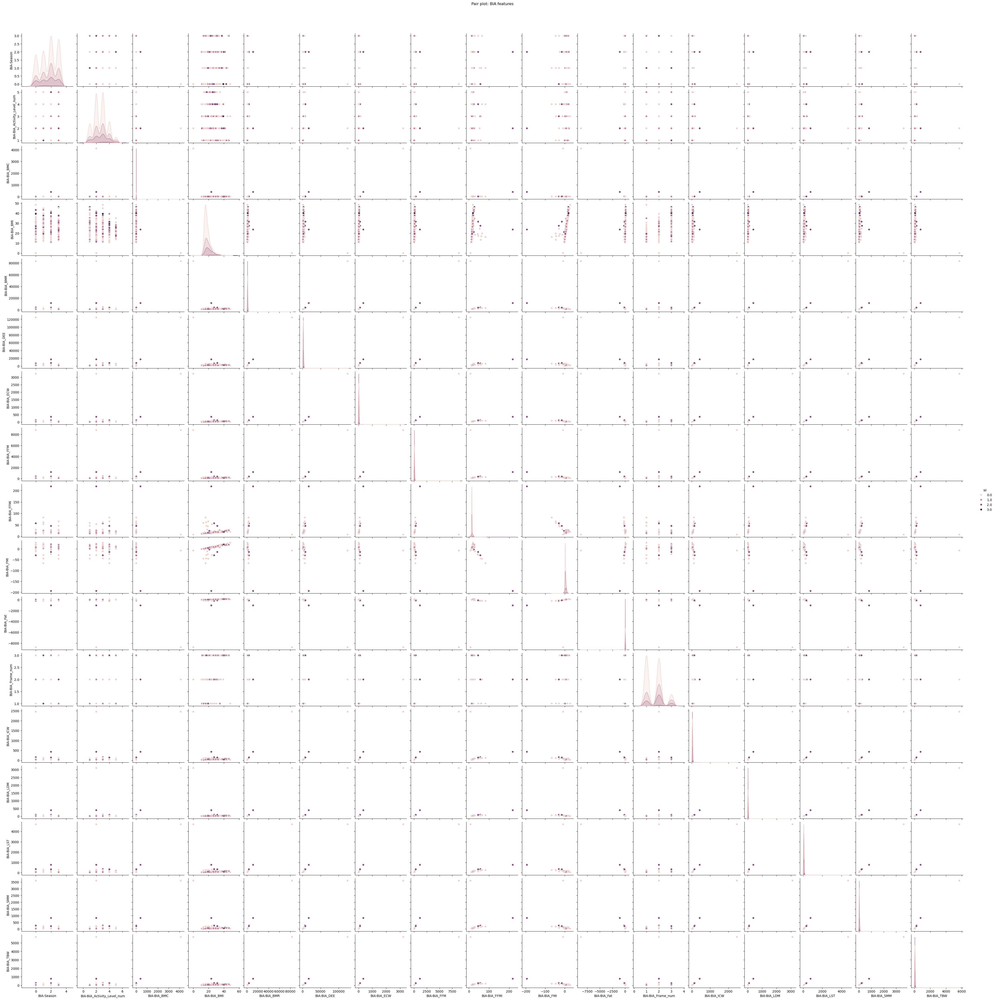

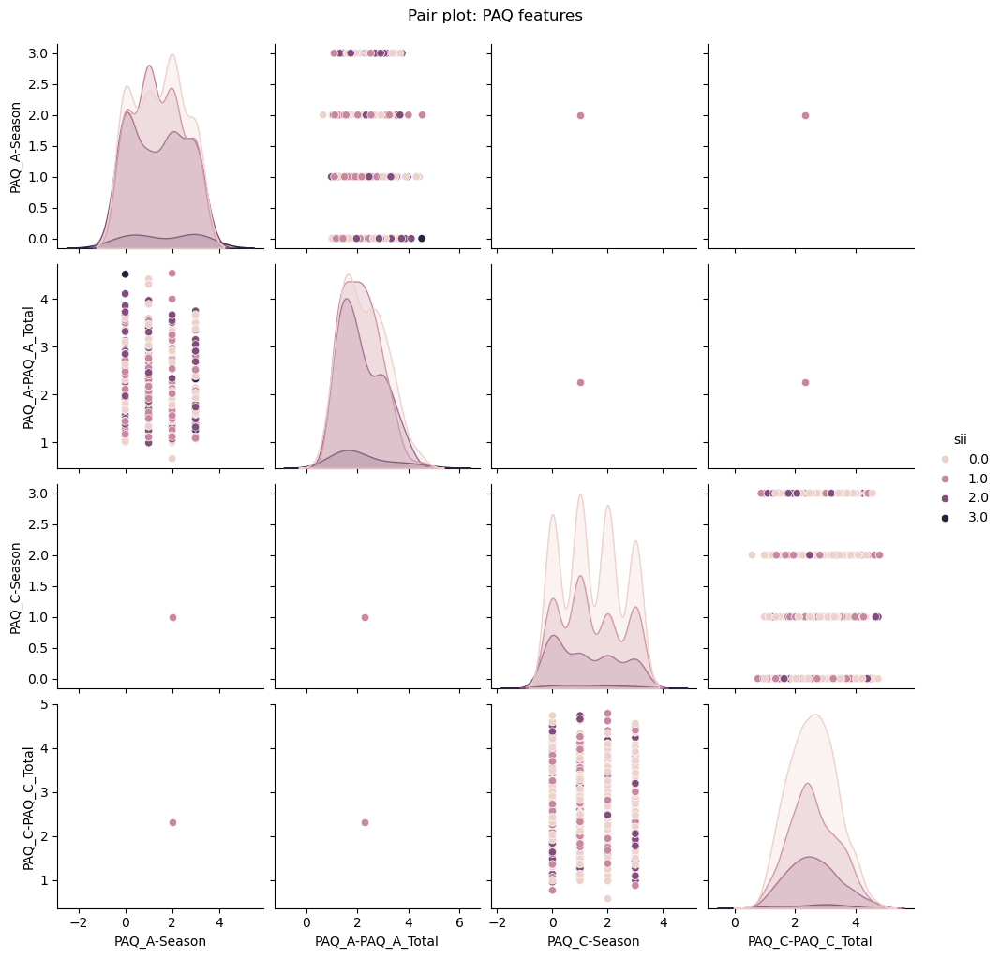

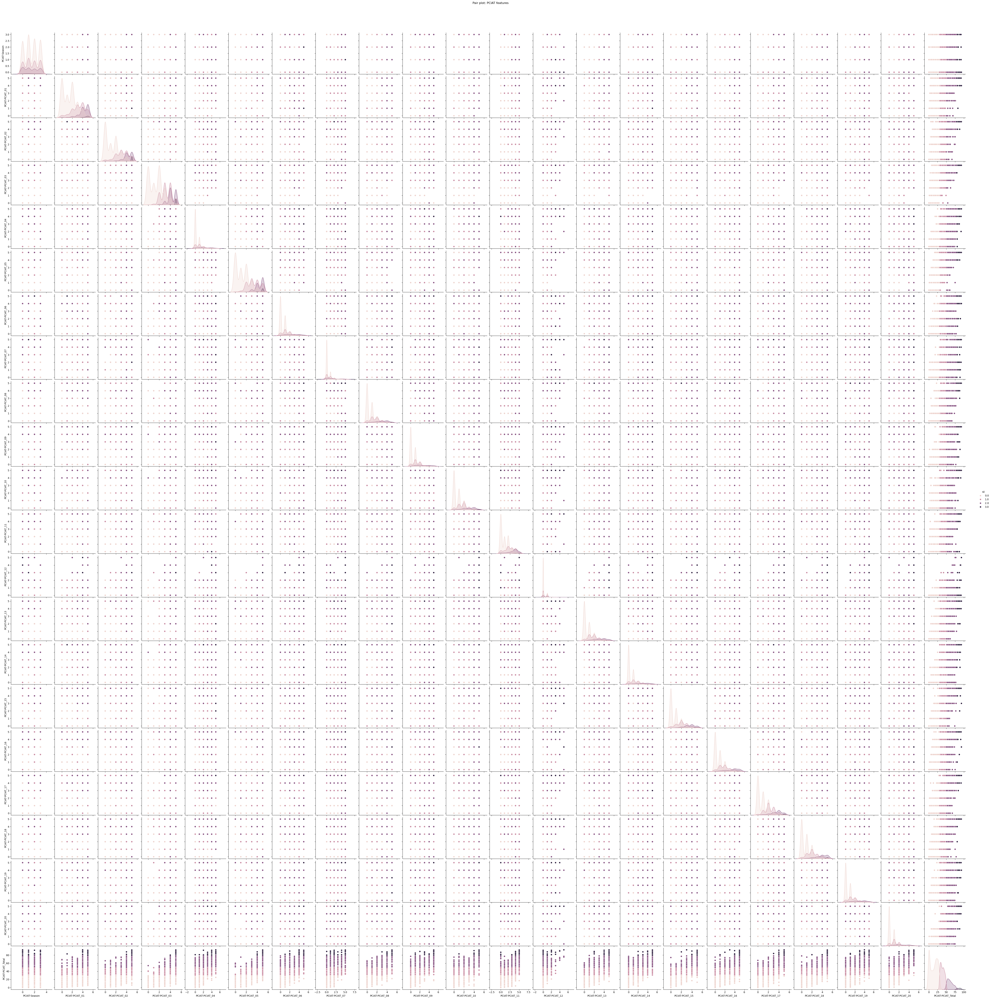

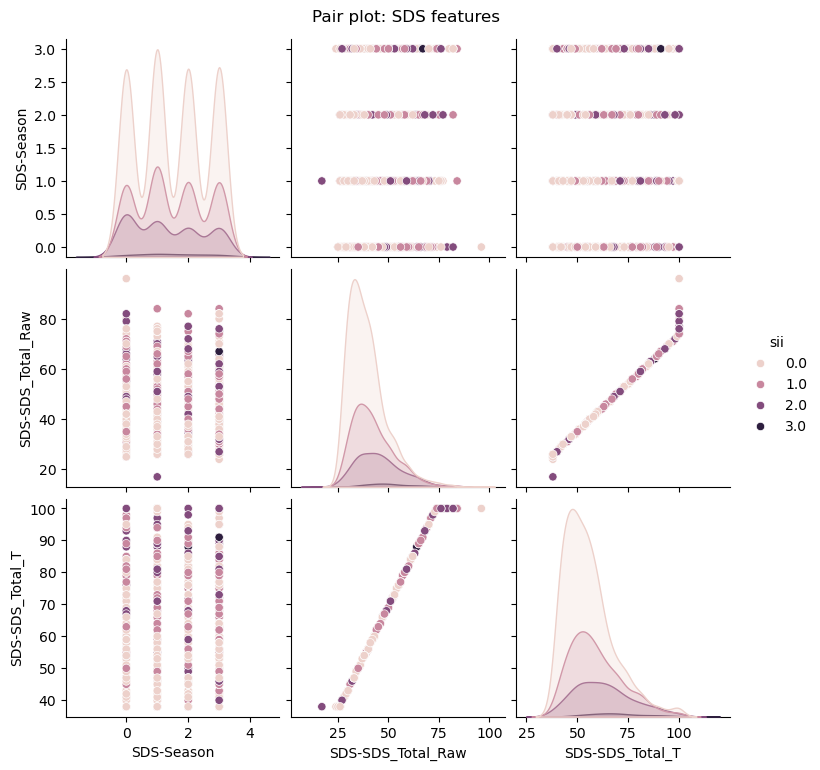

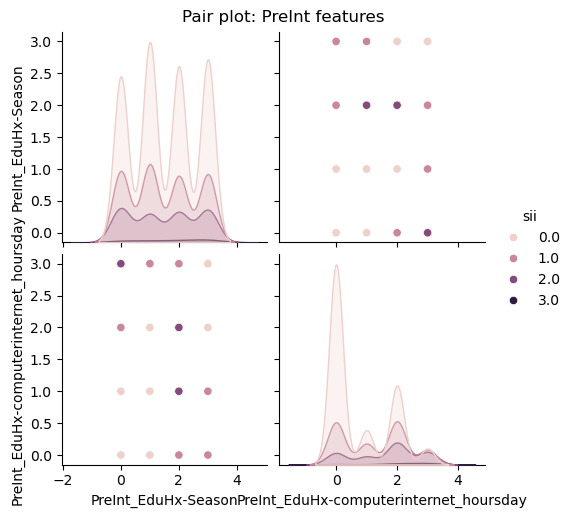

In [67]:
for k,v in col_groups.items():
    tmp = data.loc[:,v + ['sii']]
    pp = sns.pairplot(tmp, hue='sii')
    pp.fig.suptitle('Pair plot: '+ k + ' features', y=1.02)
    plt.show()
